In [ ]:
%matplotlib inline
%reload_ext line_profiler

import numpy as np
import numpy.random as rand
import pandas as pd
from pandas.plotting import parallel_coordinates
import matplotlib.pyplot as plt


def matrix_to_csv(source_file, destination_file):
    data = file(source_file, "r")
    data_csv = file(destination_file, "w+")
    data_lists = data.read().strip().split("\n")
    data_lists = [x.strip() for x in data_lists]

    for line in data_lists:
        line_elements = line.split()
        temp_string = ""
        for index, element in enumerate(line_elements):
            temp_string += element
            if index < len(line_elements) - 1:
                temp_string += ","
            else:
                temp_string += "\n"
        data_csv.write(temp_string)

    data_csv.flush()
    data_csv.close()

def read_matrix(filename):
    matrix_file = open(filename, "r")
    lines = matrix_file.read().strip().split("\n")
    matrix_file.close()
    lines = list(' -'.join(line.split('-')).split(' ') for line in lines)
    lines = list(list(int(i) for i in line if i) for line in lines)
    return np.array(lines)

def clean(matrix):
    temp_matrix = np.copy(matrix)
    generator = np.random.RandomState(0)
    # get the coordinates of rows and column that respect the condition
    idx = np.where(temp_matrix == -1)
    #print idx
    # access elements according to idx and replace them with a new array of random values
    temp_matrix[idx] = generator.randint(0, 801, len(idx[0]))
    return temp_matrix

def mean_squared_residue(matrix):
    matrix_array = matrix.values
    '''
    rows = matrix_array.shape[0]
    cols = matrix_array.shape[1]
    total = 0
    matrix_mean = np.mean(matrix_array)
    mean_rows = np.empty([rows,1])
    mean_cols = np.empty([cols,1])
    for row in range(rows):
        mean_rows[row] = np.mean(matrix_array[row])
    for col in range(cols):
        mean_cols[col] = np.mean(matrix_array[:,col])
    for row in range(rows):
        row_mean = mean_rows[row]
        for col in range(cols):
            col_mean = mean_cols[col]
            element = matrix_array[row, col]
            total += (element - row_mean - col_mean + matrix_mean)**2
    '''
    msr = lambda a: (np.power(a - a.mean(axis=1, keepdims=True) -
                          a.mean(axis=0) + a.mean(), 2).mean())
    return msr(matrix_array)

def mean_squared_residue_row(source_matrix):
    matrix = source_matrix.values
    rows = matrix.shape[0]
    cols = matrix.shape[1]
    max_index = -1
    max_d = -1
    matrix_mean = np.mean(matrix)
    mean_rows = np.empty([rows,1])
    mean_cols = np.empty([cols,1])
    for row in range(rows):
        mean_rows[row] = np.mean(matrix[row])
    for col in range(cols):
        mean_cols[col] = np.mean(matrix[:,col])
        
    for row in range(rows):
        d = 0
        row_mean = mean_rows[row]
        for col in range(cols):
            col_mean = mean_cols[col]
            element = matrix[row, col]
            d += (element - row_mean - col_mean + matrix_mean)**2
        if d > max_d:
            max_index = row
            max_d = d

    return max_index, max_d
    

def mean_squared_residue_col(source_matrix):
    matrix = source_matrix.values
    rows = matrix.shape[0]
    cols = matrix.shape[1]
    max_index = -1
    max_d = -1
    matrix_mean = np.mean(matrix)
    mean_rows = np.empty([rows,1])
    mean_cols = np.empty([cols,1])
    for row in range(rows):
        mean_rows[row] = np.mean(matrix[row])
    for col in range(cols):
        mean_cols[col] = np.mean(matrix[:,col])
    for col in range(cols):
        d = 0
        col_mean = mean_cols[col]
        for row in range(rows):
            row_mean = mean_rows[row]
            element = matrix[row, col]
            d += (element - row_mean - col_mean + matrix_mean)**2 / rows
        if d > max_d:
            max_index = col
            max_d = d

    return max_index, max_d
'''
#def single_node_deletion(matrix, msr_threshold=300):
    temp_matrix = np.copy(matrix)
    msr = mean_squared_residue(temp_matrix)
    print "Mean squared error original matrix: " + str(msr)
    count = 1
    while msr > msr_threshold:
        max_d_indexR, max_d_valueR = mean_squared_residue_row(temp_matrix)
        max_d_indexC, max_d_valueC = mean_squared_residue_col(temp_matrix)

        if max_d_valueR > max_d_valueC:
            temp_matrix = np.delete(temp_matrix, max_d_indexR, axis=0)
            print "Node deletion row: " + str(max_d_indexR) + " " + str(max_d_valueR)
        else:
            temp_matrix = np.delete(temp_matrix, max_d_indexC, axis=1)
            print "Node deletion column: " + str(max_d_indexC) + " " + str(max_d_valueC)
        msr = mean_squared_residue(temp_matrix)
        print "Mean squared error matrix after " + str(count) + " node deletion: " + str(msr)
        count += 1

    return matrix
'''
def single_node_deletion_df(matrix, msr_threshold=300):
    print "SINGLE NODE DELETION"
    df = matrix.copy()
    msr = mean_squared_residue(df)
    print "Mean squared error original matrix: " + str(msr)
    count = 0
    while msr >= msr_threshold:
        max_d_indexR, max_d_valueR = mean_squared_residue_row(df)
        max_d_indexC, max_d_valueC = mean_squared_residue_col(df)
        if max_d_valueR > max_d_valueC:
            #print df.index.values[max_d_indexR]
            #print df
            df.drop(df.index.values[max_d_indexR], axis=0, inplace=True)
            #print "Node deletion row: " + str(df.index.values[max_d_indexR]) + " " + str(max_d_valueR)
        else:
            df.drop(df.columns.values[max_d_indexC], axis=1, inplace=True)
            #print "Node deletion column: " + str(df.columns.values[max_d_indexC]) + " " + str(max_d_valueC)
        msr = mean_squared_residue(df)
        #print "Mean squared error matrix after " + str(count) + " node deletion: " + str(msr)
        count += 1
    print "Single node deletetion finished"
    print "Mean squared error matrix after " + str(count) + " single node deletion: " + str(msr)
    return matrix
'''
#def multiple_deletion_node(matrix, alpha=1.2):
    temp_matrix = np.copy(matrix)
    msr = mean_squared_residue(temp_matrix)
    print "Mean squared residue source matrix: " + str(msr)
    deletion = True
    cluster_schema = np.ones(matrix.shape)
    while deletion:
        rows = temp_matrix.shape[0]
        cols = temp_matrix.shape[1]
        # mean of the matrix
        matrix_mean = np.mean(temp_matrix)
        # initialize array that will contain the mean of each row/column
        mean_row = np.empty([rows, 1])
        mean_col = np.empty([cols, 1])
        for row in range(rows):
            mean_row[row] = np.mean(temp_matrix[row])
        for col in range(cols):
            mean_col[col] = np.mean(temp_matrix[:, col])

        rows_to_remove = []
        for row in range(rows):
            d = 0
            for col in range(cols):
                element = temp_matrix[row, col]
                d += (element - mean_row[row] -
                      mean_col[col] + matrix_mean)**2 / cols
            if d > alpha * msr:
                rows_to_remove.append(row)
        print "n of removed rows: " + str(len(rows_to_remove))
        temp_matrix = np.delete(temp_matrix, rows_to_remove, axis=0)
        mean_row = np.delete(mean_row, rows_to_remove, axis=0)
        # update cluster schema
        for x in rows_to_remove:
            cluster_schema[x] = 0
        print temp_matrix.shape
        msr = mean_squared_residue(temp_matrix)
        print msr

        cols_to_remove = []
        if matrix.shape[1] > 100:
            matrix_mean = np.mean(temp_matrix)
            rows = temp_matrix.shape[0]
            for col in range(cols):
                mean_col[col] = np.mean(temp_matrix[:, col])

            for col in range(cols):
                d = 0
                for row in range(rows):
                    element = temp_matrix[row, col]
                    d += (element - mean_row[row] -
                          mean_col[col] + matrix_mean)**2 / rows
                if d > alpha * msr:
                    cols_to_remove.append(col)
            print "n of removed columns: " + str(len(cols_to_remove))
            temp_matrix = np.delete(temp_matrix, cols_to_remove, axis=1)
            mean_col = np.delete(mean_col, cols_to_remove, axis=0)
            # update cluster schema
            cluster_schema[:, cols_to_remove] = 0
            print temp_matrix.shape
            msr = mean_squared_residue(temp_matrix)
            print msr

        if len(rows_to_remove) == 0 and len(cols_to_remove) == 0:
            print "Multiple Deletion Node finished"
            print "Mean squared residue result matrix: " + str(msr)
            np.savetxt("cluster_schema.matrix", cluster_schema, "%i")
            deletion = False

    return temp_matrix
'''

def multiple_deletion_node_df(matrix, msr_threshold=300, alpha=1.2, verbose=False):  
    print "MUTLIPLE NODE DELETION"
    df = matrix.copy()
    delete_rows = matrix.shape[0] > 100
    delete_cols = matrix.shape[1] > 100
    msr = mean_squared_residue(df)
    print "Mean squared residue source matrix: " + str(msr)
    deletion = True

    while deletion and msr >= msr_threshold:
        rows = df.shape[0]
        cols = df.shape[1]
        # mean of the matrix
        matrix_mean = df.mean().mean()
        # initialize array that will contain the mean of each row/column
        mean_row = np.empty([rows, 1])
        mean_col = np.empty([cols, 1])
        for row in range(rows):
            mean_row[row] = df.iloc[row].mean()
        for col in range(cols):
            mean_col[col] = df.iloc[:, col].mean()

        rows_to_remove = []
        if delete_rows:
            for row in range(rows):
                d = 0
                for col in range(cols):
                    element = df.iloc[row, col]
                    d += (element - mean_row[row] -
                          mean_col[col] + matrix_mean)**2 / cols
                if d > alpha * msr:
                    rows_to_remove.append(df.index.values[row])
            #print "n of removed rows: " + str(len(rows_to_remove))
            df.drop(rows_to_remove, axis=0, inplace=True)
            if verbose:
                print df.shape
            msr = mean_squared_residue(df)
            if verbose:
                print msr

        cols_to_remove = []
        if delete_cols:
            rows = df.shape[0]
            cols = df.shape[1]
            # mean of the matrix
            matrix_mean = df.mean().mean()
            # initialize array that will contain the mean of each row/column
            mean_row = np.empty([rows, 1])
            mean_col = np.empty([cols, 1])
            for row in range(rows):
                mean_row[row] = df.iloc[row].mean()
            for col in range(cols):
                mean_col[col] = df.iloc[:, col].mean()

            for col in range(cols):
                d = 0
                for row in range(rows):
                    element = df.iloc[row, col]
                    d += (element - mean_row[row] -
                          mean_col[col] + matrix_mean)**2 / rows
                if d > alpha * msr:
                    cols_to_remove.append(df.columns.values[col])
            #print "n of removed columns: " + str(len(cols_to_remove))
            df.drop(rows_to_remove, axis=1, inplace=True)
            if verbose:
                print df.shape 
            msr = mean_squared_residue(df)
            if verbose:
                print msr

        if (len(rows_to_remove) == 0 and len(cols_to_remove) == 0):
            deletion = False

    print "Multiple Deletion Node finished"
    print "Mean squared residue result matrix: " + str(msr)
    if verbose:
        print df

    return df

def multiple_deletion_node_df2(matrix, msr_threshold=300, alpha=1.2, verbose=False):
    ''' Ricorda di aggiungere i controllo per vedere se le righe sono meno o piu di 100'''
    print "MUTLIPLE NODE DELETION"
    bicluster = matrix.copy()
    delete_rows = matrix.shape[0] > 100
    delete_cols = matrix.shape[1] > 100
    msr = mean_squared_residue(bicluster)
    # mean of the matrix
    bicluster_mean = bicluster.mean().mean()
    mean_rows = {}
    mean_cols = {}
    for i,row in bicluster.iterrows():
        mean_rows[i] = row.mean()
    for i,col in bicluster.iteritems():
        mean_cols[i] = col.mean()
    print "Mean squared residue source matrix: " + str(msr)
    deletion = True
    while deletion and msr >= msr_threshold:
        
        rows_to_remove = []
        if delete_rows:
            for row in bicluster.itertuples():
                d = 0
                for j,col in enumerate(bicluster.columns.values):
                    element = row[j+1]
                    d += (element - mean_rows[row.Index] -
                          mean_cols[col] + bicluster_mean)**2 / bicluster.shape[1]
                if d > alpha * msr:
                    rows_to_remove.append(row.Index)
            #print "n of removed rows: " + str(len(rows_to_remove))
            if len(rows_to_remove) > 0:
                map(mean_rows.pop,rows_to_remove)
                bicluster.drop(rows_to_remove, axis=0, inplace=True)
                msr = mean_squared_residue(bicluster)
                bicluster_mean = bicluster.mean().mean()
                for i,col in bicluster.iteritems():
                    mean_cols[i] = col.mean()
            if verbose:
                print bicluster.shape
            if verbose:
                print msr

        cols_to_remove = []
        if delete_cols:
            for j,col in iteritems():
                d = 0
                for i in bicluster.index.values:
                    element = col[i]
                    d += (element - mean_rows[i] -
                          mean_cols[j] + bicluster_mean)**2 / bicluster.shape[0]
                if d > alpha * msr:
                    cols_to_remove.append(j)
            #print "n of removed columns: " + str(len(cols_to_remove))
            if len(cols_to_remove) > 0:
                map(mean_cols.pop,cols_to_remove)
                bicluster.drop(cols_to_remove, axis=1, inplace=True)
                msr = mean_squared_residue(bicluster)
                bicluster_mean = bicluster.mean().mean()
                for i,row in bicluster.iterrows():
                    mean_rows[i] = row.mean()
            if verbose:
                print bicluster.shape 
            if verbose:
                print msr

        if (len(rows_to_remove) == 0 and len(cols_to_remove) == 0):
            deletion = False

    print "Multiple Deletion Node finished"
    print "Mean squared residue result matrix: " + str(msr)
    if verbose:
        print bicluster

    return bicluster
'''
#def multiple_deletion_node_dfp(matrix, msr_threshold=300, alpha=1.2, verbose=False):
    print "MUTLIPLE NODE DELETION"
    df = matrix.copy()
    delete_rows = matrix.shape[0] > 100
    delete_cols = matrix.shape[1] > 100
    msr = mean_squared_residue(df.values)
    print "Mean squared residue source matrix: " + str(msr)
    deletion = True

    while deletion and msr >= msr_threshold:
        rows = df.shape[0]
        cols = df.shape[1]
        # mean of the matrix
        matrix_mean = df.mean().mean()
        # initialize array that will contain the mean of each row/column
        mean_row = np.empty([rows, 1])
        mean_col = np.empty([cols, 1])
        for row in range(rows):
            mean_row[row] = df.iloc[row].mean()
        for col in range(cols):
            mean_col[col] = df.iloc[:, col].mean()

        rows_to_remove = []
        if delete_rows:
            n_row = 0
            for i,row in df.iterrows():
                d = 0
                for col in range(cols):
                    element = row[col]
                    d += (element - mean_row[n_row] -
                          mean_col[col] + matrix_mean)**2 / cols
                n_row += 1        
                if d > alpha * msr:
                    rows_to_remove.append(i)
            #print "n of removed rows: " + str(len(rows_to_remove))
            df.drop(rows_to_remove, axis=0, inplace=True)
            if verbose:
                print df.shape
            msr = mean_squared_residue(df.values)
            if verbose:
                print msr

        cols_to_remove = []
        if delete_cols:
            rows = df.shape[0]
            cols = df.shape[1]
            # mean of the matrix
            matrix_mean = df.mean().mean()
            # initialize array that will contain the mean of each row/column
            mean_row = np.empty([rows, 1])
            mean_col = np.empty([cols, 1])
            for row in range(rows):
                mean_row[row] = df.iloc[row].mean()
            for col in range(cols):
                mean_col[col] = df.iloc[:, col].mean()

            for col in range(cols):
                d = 0
                for row in range(rows):
                    element = df.iloc[row, col]
                    d += (element - mean_row[row] -
                          mean_col[col] + matrix_mean)**2 / rows
                if d > alpha * msr:
                    cols_to_remove.append(df.columns.values[col])
            #print "n of removed columns: " + str(len(cols_to_remove))
            df.drop(rows_to_remove, axis=1, inplace=True)
            if verbose:
                print df.shape 
            msr = mean_squared_residue(df.values)
            if verbose:
                print msr

        if (len(rows_to_remove) == 0 and len(cols_to_remove) == 0):
            deletion = False

    print "Multiple Deletion Node finished"
    print "Mean squared residue result matrix: " + str(msr)
    if verbose:
        print df

    return df
'''
'''
#def node_addition(cluster1, matrix, verbose=False):
    print "NODE ADDITION"
    cluster = cluster1.copy()
    df = matrix #to_rename TODO
    df_indexes = df.index.values
    df_columns = df.columns.values
    df_n_indexes = len(df_indexes)
    df_n_cols= len(df_columns)
    matrix_mean = df.mean().mean()  # aIJ
    deletion = True
    while deletion:
        msr = mean_squared_residue(cluster)
        row_indexes = np.setdiff1d(df_indexes, cluster.index.values)  #indexes in matrixA but not in cluster
        col_indexes = np.setdiff1d(df_columns, cluster.columns.values) #columns in matrixA but not in cluster
        cluster_mean = cluster.mean().mean()  # H(I,J)
        mean_row = np.empty([len(df.index), 1])  # aiJ
        mean_col = np.empty([len(df.columns), 1])  # aIj
        for row in range(len(df.index)):
            mean_row[row] = df.iloc[row].mean()
        for col in range(len(df.columns)):
            mean_col[col] = df.iloc[:, col].mean()

        cols_to_append = []
        for col in col_indexes:
            d = 0
            for row in range(len(cluster.index)):
                element = df.loc[cluster.index.values[row], col]
                d += (element - mean_row[row] -
                      mean_col[col] + matrix_mean)**2 / len(cluster.index)
            #print(d)
            if d <= msr:
                cols_to_append.append(df.loc[:, col])
        #print "n of appended columns: " + str(len(cols_to_append))
        for col in cols_to_append:
            cluster = pd.concat([cluster, col], axis=1,
                                join_axes=[cluster.index])
        if verbose:
            print cluster.shape
        msr = mean_squared_residue(cluster)
        if verbose:
            print msr
            
        # update values
        #row_indexes = np.setdiff1d(df.index.values, cluster.index.values)
        #col_indexes = np.setdiff1d(df.columns.values, cluster.columns.values)
        cluster_mean = cluster.mean().mean()
        mean_row = np.empty([len(df.index), 1])
        mean_col = np.empty([len(df.columns), 1])
        for row in range(len(df.index)):
            mean_row[row] = df.iloc[row].mean()
        for col in range(len(df.columns)):
            mean_col[col] = df.iloc[:, col].mean()

        rows_to_append = []
        for row in row_indexes:
            d = 0
            for col in range(len(cluster.columns)):
                element = df.loc[row, cluster.columns.values[col]]
                d += (element - mean_row[row] -
                      mean_col[col] + matrix_mean)**2 / len(cluster.columns)
            if d <= msr:
                rows_to_append.append(df.loc[row])
        #print "n of appended rows: " + str(len(rows_to_append))
        for row in rows_to_append:
            #print row
            #cluster = pd.concat([cluster, row], axis=0,
            #                    join_axes=[cluster.columns])
            cluster = cluster.append(row)
            #print cluster
        if verbose:
            print cluster.shape
        msr = mean_squared_residue(cluster)
        if verbose:
            print msr
    
        # update values
        row_indexes = np.setdiff1d(df.index.values, cluster.index.values)
        #col_indexes = np.setdiff1d(df.columns.values, cluster.columns.values)
        cluster_mean = cluster.mean().mean()
        mean_row = np.empty([len(df.index), 1])
        mean_col = np.empty([len(df.columns), 1])
        for row in range(len(df.index)):
            mean_row[row] = df.iloc[row].mean()
        for col in range(len(df.columns)):
            mean_col[col] = df.iloc[:, col].mean()

        rows_inverted_to_append = []
        for row in row_indexes:
            d = 0
            for col in range(len(cluster.columns)):
                element = df.loc[row, cluster.columns.values[col]]
                d += (-element + mean_row[row] -
                      mean_col[col] + matrix_mean)**2 / len(cluster.columns)
            if d <= msr:
                rows_inverted_to_append.append(reverse_row(df.loc[row]))
        #print "n of appended inverted rows: " + str(len(rows_inverted_to_append))
        for row in rows_inverted_to_append:
            cluster = cluster.append(row)
        if verbose:
            print cluster.shape
        msr = mean_squared_residue(cluster)
        if verbose:
            print msr

            
        if (len(rows_to_append) == 0 and len(cols_to_append) == 0 and len(rows_inverted_to_append) == 0):
            deletion = False

    print "Node addition finished"
    print "Mean squared residue result matrix: " + str(msr)
    if verbose:
        print cluster

    return cluster
'''
def node_addition_p(cluster1, matrix, verbose=False):
    print "NODE ADDITION"
    cluster = cluster1.copy()
    df = matrix #to_rename TODO
    df_indexes = df.index.values
    df_columns = df.columns.values
    df_n_indexes = len(df_indexes)
    df_n_cols= len(df_columns)
    matrix_mean = df.mean().mean()  # aIJ
    msr = mean_squared_residue(cluster)
    cluster_mean = cluster.mean().mean()  # H(I,J)
    mean_row = np.empty([len(df.index), 1])  # aiJ
    mean_col = np.empty([len(df.columns), 1])  # aIj
    for i,row in df.iterrows():
        mean_row[i] = row.mean()
    for i,col in df.iteritems():
        mean_col[i] = col.mean()
    row_indexes = np.setdiff1d(df_indexes, cluster.index.values)  #indexes in matrixA but not in cluster
    col_indexes = np.setdiff1d(df_columns, cluster.columns.values) #columns in matrixA but not in cluster
    deletion = True
    
    while deletion:
        
        cols_to_append = []
        for col in col_indexes:
            d = 0
            for row in range(len(cluster.index)):
                element = df.loc[cluster.index.values[row], col]
                d += (element - mean_row[row] -
                      mean_col[col] + matrix_mean)**2 / len(cluster.index)
            #print(d)
            if d <= msr:
                cols_to_append.append(df.loc[:, col])
        #print "n of appended columns: " + str(len(cols_to_append))
        for col in cols_to_append:
            cluster = pd.concat([cluster, col], axis=1,
                                join_axes=[cluster.index])
        if verbose:
            print cluster.shape
        if len(cols_to_append) > 0:
            msr = mean_squared_residue(cluster)
            cluster_mean = cluster.mean().mean()
            col_indexes = np.setdiff1d(df_columns, cluster.columns.values) #columns in matrixA but not in cluster
        if verbose:
            print msr
            
        rows_to_append = []
        for row in row_indexes:
            d = 0
            for col in range(len(cluster.columns)):
                element = df.loc[row, cluster.columns.values[col]]
                d += (element - mean_row[row] -
                      mean_col[col] + matrix_mean)**2 / len(cluster.columns)
            if d <= msr:
                rows_to_append.append(df.loc[row])
        #print "n of appended rows: " + str(len(rows_to_append))
        for row in rows_to_append:
            cluster = cluster.append(rows_to_append)
        if verbose:
            print cluster.shape
        if len(rows_to_append) > 0:
            msr = mean_squared_residue(cluster)
            cluster_mean = cluster.mean().mean()
            row_indexes = np.setdiff1d(df.index.values, cluster.index.values)
        if verbose:
            print msr

        rows_inverted_to_append = []
        for row in row_indexes:
            d = 0
            for col in range(len(cluster.columns)):
                element = df.loc[row, cluster.columns.values[col]]
                d += (-element + mean_row[row] -
                      mean_col[col] + matrix_mean)**2 / len(cluster.columns)
            if d <= msr:
                rows_inverted_to_append.append(reverse_row(df.loc[row]))
        #print "n of appended inverted rows: " + str(len(rows_inverted_to_append))
        for row in rows_inverted_to_append:
            cluster = cluster.append(row)
        if verbose:
            print cluster.shape
        if len(rows_inverted_to_append) > 0:
            msr = mean_squared_residue(cluster)
            cluster_mean = cluster.mean().mean()  # H(I,J)
            row_indexes = np.setdiff1d(df.index.values, cluster.index.values)
        if verbose:
            print msr
      
        if (len(rows_to_append) == 0 and len(cols_to_append) == 0 and len(rows_inverted_to_append) == 0):
            deletion = False

    print "Node addition finished"
    print "Mean squared residue result matrix: " + str(msr)
    if verbose:
        print cluster

    return cluster
'''
def hide_bicluster(bicluster, matrix):
    generator = np.random.RandomState(0)
    for row in bicluster.index.values:
        for col in bicluster.columns.values:
            matrix.iloc[row,col] = generator.randint(0,801)
    print("Last bicluster masked on matrix")
    return matrix
'''

def hide_bicluster_p(bicluster, matrix):
    generator = np.random.RandomState(0)
    bicluster_cols = bicluster.columns.values
    cols = len(bicluster_cols)
    for row in bicluster.index.values:
        matrix.loc[row,bicluster_cols] = generator.randint(0,801,cols)
    print("Last bicluster masked on matrix")
    return matrix

def hide_bicluster_pp(bicluster, matrix):
    generator = np.random.RandomState(0)
    bicluster_cols = bicluster.columns.values
    cols = len(bicluster_cols)
    matrix_array = matrix.values
    for i in bicluster.index.values:
        matrix_array[i,bicluster_cols] = generator.randint(0,801,cols)
    print("Last bicluster masked on matrix")
    return pd.DataFrame(matrix_array)

def plot_bicluster(bicluster1, bicluster_name="Bicluster"):
    '''Ricorda di rimuovere la legenda e copiare il cluster'''
    bicluster = bicluster1.copy()
    bicluster["index"] = bicluster.index.values
    parallel_coordinates(bicluster, "index", linewidth=1.0)
    plt.title(bicluster_name)
    plt.xlabel('column')
    plt.ylabel('expression level')
    plt.gca().legend_ = None
    plt.show()
    
    
    
def find_biclusters(matrix, n_of_bicluster=10, msr_threshold=300, alpha=1.2, verbose=False):
    matrixA = matrix.copy()
    biclusters = []
    for i in range(n_of_bicluster):
        biclusterB = multiple_deletion_node_df(
            matrixA, msr_threshold=msr_threshold, alpha=alpha, verbose=verbose)
        biclusterC = single_node_deletion_df(
            biclusterB, msr_threshold=msr_threshold)
        biclusterD = node_addition_p(biclusterC, matrix, verbose=verbose)
        print "Bicluster " + str(i)
        #print biclusterD 
        biclusters.append(biclusterD)
        hide_bicluster_pp(biclusterD, matrixA)
    return biclusters

def reverse_row(row):
    temp_row = row.iloc[::-1]
    reversed_row = row.copy()
    reversed_row.iloc[:] = temp_row.values 
    return reversed_row

In [458]:
data = read_matrix("yeast.matrix")
data = clean(data)
df_data = pd.DataFrame(data)

In [ ]:
cluster1 = multiple_deletion_node_df(df_data,verbose=True)
cluster2 = node_addition_p(cluster1,df_data)

In [464]:
def mean_squared_residue_np(matrix,rows, cols, inverted_rows = np.array([])):
    matrix2 = matrix[rows][:,cols]
    if inverted_rows.size > 0:
        matrix_inverted = np.flip(matrix[inverted_rows][:,cols],1)
        matrix2 = np.append(matrix2,matrix_inverted,0)

    msr = lambda a: (np.power(a - a.mean(axis=1, keepdims=True) -
                          a.mean(axis=0) + a.mean(), 2).mean())
    return msr(matrix2)

def multiple_deletion_node_np(matrix, msr_threshold=300, alpha=1.2):
    rows = np.arange(0,matrix.shape[0])
    cols = np.arange(0,matrix.shape[1])
    msr = mean_squared_residue_np(matrix,rows,cols)
    print "MSR before multiple_deletion_node\t" + str(msr)
    rows_mean = matrix[rows].mean(axis=1, keepdims=True)
    cols_mean = matrix[rows][:,cols].mean(axis=0)
    deletion = True
    while deletion and msr > msr_threshold:
        
        arr = matrix[rows][:,cols] - rows_mean - cols_mean
        arr += np.mean(matrix[rows][:,cols])
        msr_rows = np.power(arr,2).mean(axis=1)
        rows_to_remove = msr_rows <= (alpha * msr)
        rows = rows[rows_to_remove]
        msr = mean_squared_residue_np(matrix,rows,cols)
        rows_mean = matrix[rows].mean(axis=1, keepdims=True)
        cols_mean = matrix[rows][:,cols].mean(axis=0)
        
        cols_to_remove = np.array([])
        if matrix.shape[1] > 100:
            arr = matrix[rows][:,cols] - rows_mean - cols_mean
            arr += np.mean(matrix[rows][:,cols])
            msr_cols = np.power(arr,2).mean(axis=0)
            cols_to_remove = msr_cols <= (alpha * msr)
            cols = cols[cols_to_remove]
            msr = mean_squared_residue_np(matrix,rows,cols)
            rows_mean = matrix[rows].mean(axis=1, keepdims=True)
            cols_mean = matrix[rows][:,cols].mean(axis=0)
        elements_removed = np.count_nonzero(rows_to_remove == False) + np.count_nonzero(cols_to_remove == False)
        
        if(elements_removed == 0):
            deletion = False
        
    print "MSR after multiple_deletion_node\t" + str(msr)
    return rows,cols

def single_deletion_node_np(matrix,rows,cols,msr_threshold=300):
    msr = mean_squared_residue_np(matrix,rows,cols)
    print "MSR before single_deletion_node\t" + str(msr)
    rows_mean = matrix[rows].mean(axis=1, keepdims=True)
    cols_mean = matrix[rows][:,cols].mean(axis=0)
    deletion = True
    while msr > msr_threshold:
        
        arr = matrix[rows][:,cols] - rows_mean - cols_mean
        arr += np.mean(matrix[rows][:,cols])
        msr_rows = np.power(arr,2).mean(axis=1)
        msr_cols = np.power(arr,2).mean(axis=0)
        rows_max = np.amax(msr_rows)
        cols_max = np.amax(msr_cols)
        if rows_max > cols_max:
            rows = np.delete(rows,np.argmax(msr_rows))
        else:
            cols = np.delete(cols,np.argmax(msr_cols))
        msr = mean_squared_residue_np(matrix,rows,cols)
        rows_mean = matrix[rows].mean(axis=1, keepdims=True)
        cols_mean = matrix[rows][:,cols].mean(axis=0)
        #print "MSR after single_deletion_node\t" + str(msr)
        
    print "MSR after single_deletion_node\t" + str(msr)
    return rows,cols

def node_addition_np(matrix,rows,cols):
    inverted_rows = np.array([])
    matrix_rows = np.arange(0,matrix.shape[0])
    matrix_cols = np.arange(0,matrix.shape[1])
    msr = mean_squared_residue_np(matrix,rows,cols)
    print "MSR before node_addition\t" + str(msr)
    rows_mean = matrix[rows].mean(axis=1, keepdims=True)
    cols_mean = matrix[rows][:,cols].mean(axis=0)
    rows_not = np.setdiff1d(matrix_rows,rows)
    cols_not = np.setdiff1d(matrix_cols,cols)
    rows_mean_not = matrix[rows_not].mean(axis=1, keepdims=True)
    cols_mean_not = matrix[rows][:,cols_not].mean(axis=0)
    addition = True
    while addition:
        
        arr = matrix[rows_not][:,cols] - rows_mean_not - cols_mean
        arr += np.mean(matrix[rows][:,cols]) #dubbio
        msr_rows = np.power(arr,2).mean(axis=1)
        rows_to_append = msr_rows < msr
        rows = np.append(rows,rows_not[rows_to_append])
        rows_not = np.setdiff1d(rows_not,rows_not[rows_to_append])
        msr = mean_squared_residue_np(matrix,rows,cols,inverted_rows)
        rows_mean = matrix[rows].mean(axis=1, keepdims=True)
        cols_mean = matrix[rows][:,cols].mean(axis=0)
        rows_mean_not = matrix[rows_not].mean(axis=1, keepdims=True)
        cols_mean_not = matrix[rows][:,cols_not].mean(axis=0)

        arr = matrix[rows][:,cols_not] - rows_mean - cols_mean_not
        arr += np.mean(matrix[rows][:,cols]) #dubbio
        msr_cols = np.power(arr,2).mean(axis=0)
        cols_to_append = msr_cols < msr
        cols = np.append(cols,cols_not[cols_to_append])
        cols_not = np.setdiff1d(cols_not,cols_not[cols_to_append])
        msr = mean_squared_residue_np(matrix,rows,cols,inverted_rows)
        rows_mean = matrix[rows].mean(axis=1, keepdims=True)
        cols_mean = matrix[rows][:,cols].mean(axis=0)
        
        arr = -matrix[rows_not][:,cols] + rows_mean_not - cols_mean
        arr += np.mean(matrix[rows][:,cols]) #dubbio
        msr_rows = np.power(arr,2).mean(axis=1)
        rows_to_append = msr_rows < msr
        if(inverted_rows.size == 0):
            inverted_rows = rows_not[rows_to_append]
        else:
            inverted_rows = np.append(inverted_rows,rows_not[rows_to_append])
        rows_not = np.setdiff1d(rows_not,rows_not[rows_to_append])
        msr = mean_squared_residue_np(matrix,rows,cols,inverted_rows)
        rows_mean = matrix[rows].mean(axis=1, keepdims=True)
        cols_mean = matrix[rows][:,cols].mean(axis=0)
        rows_mean_not = matrix[rows_not].mean(axis=1, keepdims=True)
        cols_mean_not = matrix[rows][:,cols_not].mean(axis=0)
        
        elements_removed = np.count_nonzero(rows_to_append == True) + np.count_nonzero(cols_to_append == True)
    
        if(elements_removed == 0):
            addition = False
        
    print "MSR after node_addition\t" + str(msr)
    return rows,cols,inverted_rows

def hide_bicluster_np(matrix,rows,cols,inverted_rows = np.array([])):
    matrix2 = np.copy(matrix)
    #print mean_squared_residue_np(matrix2)
    generator = np.random.RandomState(0)
    for row in rows:
        #print matrix2[row,cols]
        matrix2[row,cols] = generator.randint(0,801,cols.size)
        #print matrix2[row,cols]
    if inverted_rows.size > 0:
        for row in inverted_rows:
            matrix2[row,cols] = generator.randint(0,801,cols.size)
    print "Last bicluster masked"
    return matrix2

def get_bicluster(matrix,rows,cols,inv):
    rows = np.append(rows,inv)
    rows.sort()
    cols.sort()
    return matrix[rows][:,cols]

def find_biclusters_np(matrix, n_of_bicluster=10, msr_threshold=300, alpha=1.2):
    matrixA = np.copy(matrix)
    biclusters = []
    for i in range(n_of_bicluster):
        rowsB, colsB = multiple_deletion_node_np(matrixA, msr_threshold=msr_threshold, alpha=alpha)
        rowsC, colsC = single_deletion_node_np(matrixA, rowsB, colsB, msr_threshold=msr_threshold)
        rowsD,colsD,invD = node_addition_np(matrix, rowsC, colsC)
        print "Bicluster " + str(i)
        biclusters.append(pd.DataFrame(get_bicluster(matrix,rowsD,colsD,invD)))
        #print matrixA.shape
        matrixA = hide_bicluster_np(matrixA, rowsD, colsD, invD)
        #print matrixA.shape
    return biclusters

In [480]:
biclusters = find_biclusters_np(data, n_of_bicluster=100,msr_threshold=200)

MSR before multiple_deletion_node	1150.2666111
MSR after multiple_deletion_node	194.016642817
MSR before single_deletion_node	194.016642817
MSR after single_deletion_node	194.016642817
MSR before node_addition	194.016642817
MSR after node_addition	199.400446557
Bicluster 0
Last bicluster masked
MSR before multiple_deletion_node	6732.99391595
MSR after multiple_deletion_node	197.800254109
MSR before single_deletion_node	197.800254109
MSR after single_deletion_node	197.800254109
MSR before node_addition	197.800254109
MSR after node_addition	204.140368513
Bicluster 1
Last bicluster masked
MSR before multiple_deletion_node	7942.95565437
MSR after multiple_deletion_node	197.562669303
MSR before single_deletion_node	197.562669303
MSR after single_deletion_node	197.562669303
MSR before node_addition	197.562669303
MSR after node_addition	190.196056765
Bicluster 2
Last bicluster masked
MSR before multiple_deletion_node	8658.00796956
MSR after multiple_deletion_node	355.6912338
MSR before single

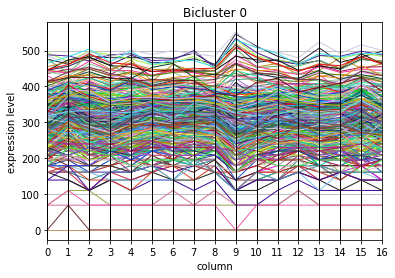

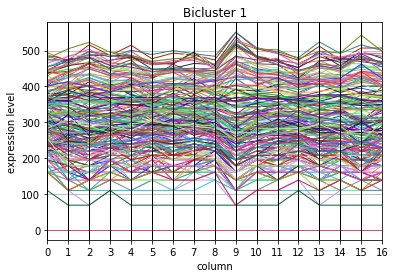

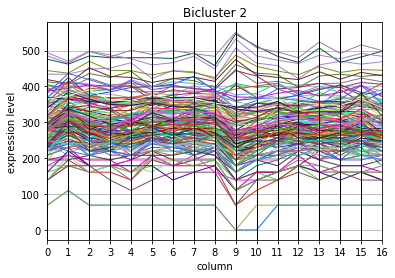

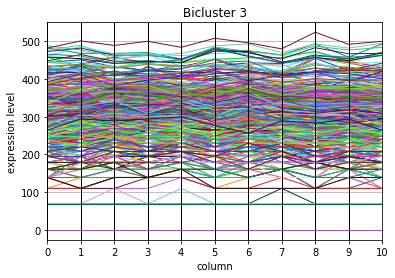

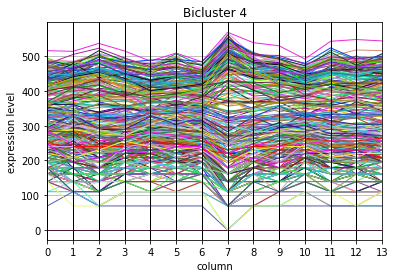

...

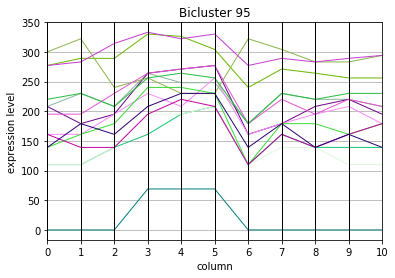

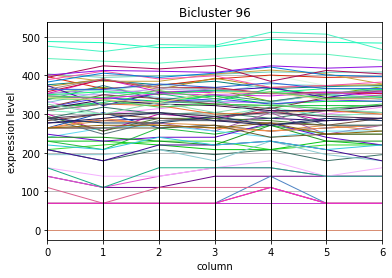

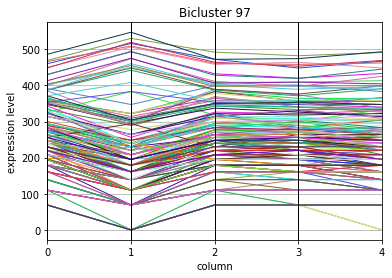

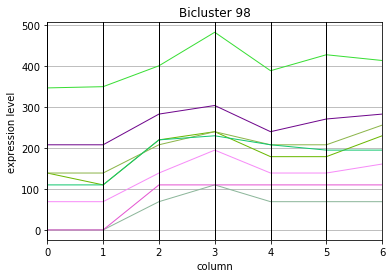

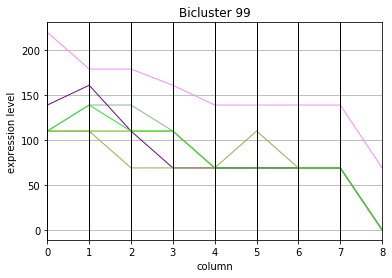

In [481]:
for i,bicluster  in enumerate(biclusters):
    plot_bicluster(bicluster,bicluster_name="Bicluster "+str(i))